<a href="https://colab.research.google.com/github/mozey256/OSCAAR/blob/main/ML_drugstructures_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [94]:
!pip install ydata_profiling

In [141]:
import pandas as pd

In [154]:
dfl = pd.read_csv('/content/Drug_smiles_MACCS.csv')

In [159]:

# lets rename the drug names removing the _conc3_T30 extension which was the lowest dosage
dfl['Drug_name'] = dfl['Drug_name'].str.replace('_conc3_T30', '')



In [160]:
dfl.head()

,Drug_name,bit0,bit1,bit2,bit3,bit4,bit5,bit6,bit7,bit8,...,bit157,bit158,bit159,bit160,bit161,bit162,bit163,bit164,bit165,bit166
0,2aminobenzothiazole,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,1,1,0,1,0
1,2hydroxyethylhydrazine,0,0,0,0,0,0,0,0,0,...,1,1,0,0,1,0,0,1,0,0
2,3aminotriazole,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,1,0,0,1,0
3,4hydroxytamoxifene,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,0
4,A23187,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,0


In [161]:
from scipy.stats import chi2_contingency

In [162]:
dfl.set_index('Drug_name', inplace = True)

In [163]:
dfl.head()

,bit0,bit1,bit2,bit3,bit4,bit5,bit6,bit7,bit8,bit9,...,bit157,bit158,bit159,bit160,bit161,bit162,bit163,bit164,bit165,bit166
Drug_name,,,,,,,,,,,,,,,,,,,,,
2aminobenzothiazole,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,1,1,0,1,0
2hydroxyethylhydrazine,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,1,0,0,1,0,0
3aminotriazole,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,1,1,0,0,1,0
4hydroxytamoxifene,0,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,0
A23187,0,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,0


In [164]:
data = dfl.T

In [165]:
data.head()

Drug_name,2aminobenzothiazole,2hydroxyethylhydrazine,3aminotriazole,4hydroxytamoxifene,A23187,abietic-acid,acifluorofen-methyl,aconitine,agelasine,alamethicin,...,thiabendazole,thozonium-bromide,tomatine,trichostatinA,trimethoprim,tunicamycin,usnic-acid,valinomycin,verrucarin,ZnCl2
bit0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
bit1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
bit2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
bit3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
bit4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [166]:
Data = data

In [167]:
Data.reset_index()

Drug_name,index,2aminobenzothiazole,2hydroxyethylhydrazine,3aminotriazole,4hydroxytamoxifene,A23187,abietic-acid,acifluorofen-methyl,aconitine,agelasine,...,thiabendazole,thozonium-bromide,tomatine,trichostatinA,trimethoprim,tunicamycin,usnic-acid,valinomycin,verrucarin,ZnCl2
0,bit0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,bit1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,bit2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,bit3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,bit4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
162,bit162,1,0,1,1,1,0,1,1,1,...,1,1,0,1,1,1,1,0,0,0
163,bit163,1,0,0,1,1,1,1,1,1,...,1,1,1,1,1,1,1,0,1,0
164,bit164,0,1,0,1,1,1,1,1,0,...,0,1,1,1,1,1,1,1,1,0
165,bit165,1,0,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,0


In [170]:
table = pd.crosstab( index =data['verrucarin'], columns = data['ZnCl2'])

print(table)

ZnCl2         0  1
verrucarin        
0           111  7
1            49  0


In [171]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency

In [ ]:
def compute_chi_square_p_values(data):
    columns = data.columns
    n = len(columns)
    p_values = pd.DataFrame(np.ones((n, n)), columns=columns, index=columns)  # Initialize with ones

    for i in range(n):
        for j in range(i + 1, n):
            table = pd.crosstab(data[columns[i]], data[columns[j]])
            chi2, p, dof, _ = chi2_contingency(table)
            _, p, _, _ = chi2_contingency(table)
            # Store p-values symmetrically since the relationship is bidirectional
            p_values.iloc[i, j] = p
            p_values.iloc[j, i] = p

    return p_values

p_values_matrix = compute_chi_square_p_values(data)

mask = np.triu(np.ones_like(p_values_matrix, dtype=bool))
plt.figure(figsize=(20, 15))  # Adjust the size as needed
sns.heatmap(p_values_matrix, mask = mask, annot=False, cmap='coolwarm', fmt=".2f")
plt.title('Heatmap of p-values for Chi-square Test of Feature Independence')
plt.show()

In [173]:
def perform_chi_square_test(data):
    columns = data.columns
    n = len(columns)
    results = []

    for i in range(n):
        for j in range(i + 1, n):
            table = pd.crosstab(data[columns[i]], data[columns[j]])
            chi2, p, dof, _ = chi2_contingency(table)

            if p<0.05:
              results.append({
                  'Feature A': columns[i],
                  'Feature B': columns[j],
                  'Chi-square': chi2,
                  'P-value': p,
                  'Degrees of freedom': dof
              })

    return pd.DataFrame(results)

all_results = perform_chi_square_test(data)
print(all_results)

                Feature A       Feature B  Chi-square       P-value  \
0     2aminobenzothiazole  3aminotriazole   59.420153  1.273581e-14   
1     2aminobenzothiazole          A23187   18.022204  2.183433e-05   
2     2aminobenzothiazole       agelasine   30.446651  3.431753e-08   
3     2aminobenzothiazole     alamethicin    4.015403  4.508645e-02   
4     2aminobenzothiazole       allantoin   20.173773  7.071587e-06   
...                   ...             ...         ...           ...   
3952          tunicamycin      verrucarin   34.248297  4.850999e-09   
3953          tunicamycin           ZnCl2    3.971184  4.628523e-02   
3954           usnic-acid     valinomycin   27.185749  1.848160e-07   
3955           usnic-acid      verrucarin   51.763910  6.259181e-13   
3956          valinomycin      verrucarin   19.061487  1.265736e-05   

      Degrees of freedom  
0                      1  
1                      1  
2                      1  
3                      1  
4           

In [174]:
import pandas as pd
from scipy.stats import chi2_contingency

def perform_chi_square_test(data, output_file):
    columns = data.columns
    n = len(columns)
    results = []

    for i in range(n):
        for j in range(i + 1, n):
            table = pd.crosstab(data[columns[i]], data[columns[j]])
            chi2, p, dof, _ = chi2_contingency(table)

            if p<0.05:
              results.append({
                  'Feature A': columns[i],
                  'Feature B': columns[j],
                  'Chi-square': chi2,
                  'P-value': p,
                  'Degrees of freedom': dof
              })

    results_df = pd.DataFrame(results)

    # Save results to a file
    if output_file.endswith('.csv'):
        results_df.to_csv(output_file, index=False)

    return results_df

all_results = perform_chi_square_test(data, 'chi_square_results.csv')


In [175]:
df = pd.read_csv('chi_square_results.csv')

In [176]:
df.info

<bound method DataFrame.info of                 Feature A       Feature B  Chi-square       P-value  \
0     2aminobenzothiazole  3aminotriazole   59.420153  1.273581e-14   
1     2aminobenzothiazole          A23187   18.022204  2.183433e-05   
2     2aminobenzothiazole       agelasine   30.446651  3.431753e-08   
3     2aminobenzothiazole     alamethicin    4.015403  4.508645e-02   
4     2aminobenzothiazole       allantoin   20.173773  7.071587e-06   
...                   ...             ...         ...           ...   
3952          tunicamycin      verrucarin   34.248297  4.850999e-09   
3953          tunicamycin           ZnCl2    3.971184  4.628523e-02   
3954           usnic-acid     valinomycin   27.185749  1.848160e-07   
3955           usnic-acid      verrucarin   51.763910  6.259181e-13   
3956          valinomycin      verrucarin   19.061487  1.265736e-05   

      Degrees of freedom  
0                      1  
1                      1  
2                      1  
3                      1  
4                      1  
...                  ...  
3952                   1  
3953                   1  
3954                   1  
3955                   1  
3956                   1  

[3957 rows x 5 columns]>

In [177]:
df.columns

Index(['Feature A', 'Feature B', 'Chi-square', 'P-value',
       'Degrees of freedom'],
      dtype='object')

In [178]:
df['Feature A'].nunique()

122

In [179]:
values = df['Feature A'].value_counts()

In [180]:
values.to_csv('FeatureA.csv')

In [181]:
valuesB = df['Feature B'].value_counts()

In [182]:
valuesB.to_csv('FeatureB.csv')

In [183]:
import ydata_profiling as rpt

report = rpt.ProfileReport(Data)

In [184]:
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [185]:
report.to_file("strdatareport.html")

/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:363: UserWarning: Try running command: 'pip install --upgrade Pillow' to avoid ValueError
  warnings.warn(


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [186]:
correlation_matrix = data.corr()
print("Correlation Matrix: ")
print(correlation_matrix)

Correlation Matrix: 
Drug_name               2aminobenzothiazole  2hydroxyethylhydrazine  \
Drug_name                                                             
2aminobenzothiazole                1.000000                0.014169   
2hydroxyethylhydrazine             0.014169                1.000000   
3aminotriazole                     0.618928                0.218188   
4hydroxytamoxifene                -0.014706                0.276702   
A23187                             0.345852                0.182839   
...                                     ...                     ...   
tunicamycin                        0.187615                0.247993   
usnic-acid                         0.103512               -0.049340   
valinomycin                        0.168610                0.089233   
verrucarin                        -0.022806                0.041027   
ZnCl2                             -0.089819               -0.020042   

Drug_name               3aminotriazole  4hydroxytamoxif

In [187]:
threshold = 0.7  # Define your correlation coefficient threshold

# Filter the correlation matrix for pairs with correlation coefficients above the threshold
highly_correlated_pairs = correlation_matrix[(correlation_matrix.abs() > threshold) & (correlation_matrix != 1)]

print("Highly Correlated Feature Pairs:")
print(highly_correlated_pairs)

Highly Correlated Feature Pairs:
Drug_name               2aminobenzothiazole  2hydroxyethylhydrazine  \
Drug_name                                                             
2aminobenzothiazole                     NaN                     NaN   
2hydroxyethylhydrazine                  NaN                     NaN   
3aminotriazole                          NaN                     NaN   
4hydroxytamoxifene                      NaN                     NaN   
A23187                                  NaN                     NaN   
...                                     ...                     ...   
tunicamycin                             NaN                     NaN   
usnic-acid                              NaN                     NaN   
valinomycin                             NaN                     NaN   
verrucarin                              NaN                     NaN   
ZnCl2                                   NaN                     NaN   

Drug_name               3aminotriazole  4hy

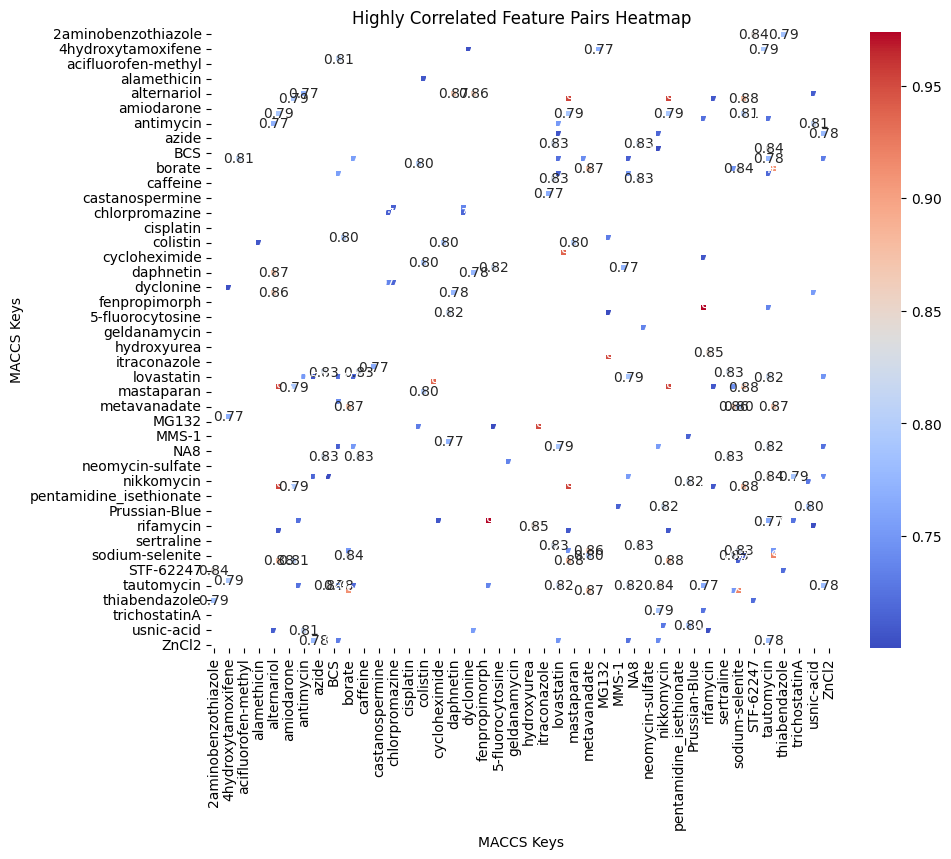

In [188]:
import seaborn as sns
import matplotlib.pyplot as plt

# highly_correlated_pairs in the DataFrame containing the highly correlated feature pairs
plt.figure(figsize=(10, 8))
sns.heatmap(highly_correlated_pairs, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Highly Correlated Feature Pairs Heatmap')
plt.xlabel('MACCS Keys')
plt.ylabel('MACCS Keys')
plt.show()


In [189]:
dcorr = highly_correlated_pairs

<Axes: xlabel='Drug_name', ylabel='Drug_name'>

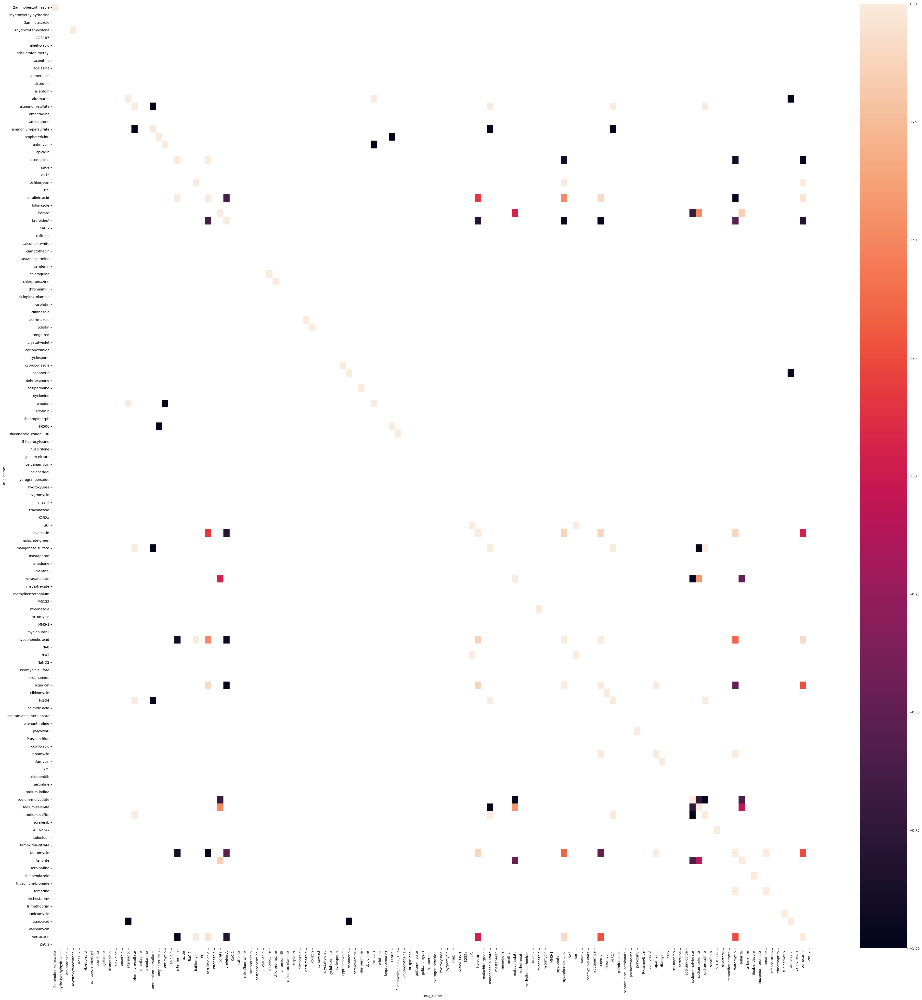

In [190]:
cormat = dcorr.corr()
round(cormat,2)
plt.figure(figsize = (50,50))
sns.heatmap(cormat)

plot only the hihly correlated features


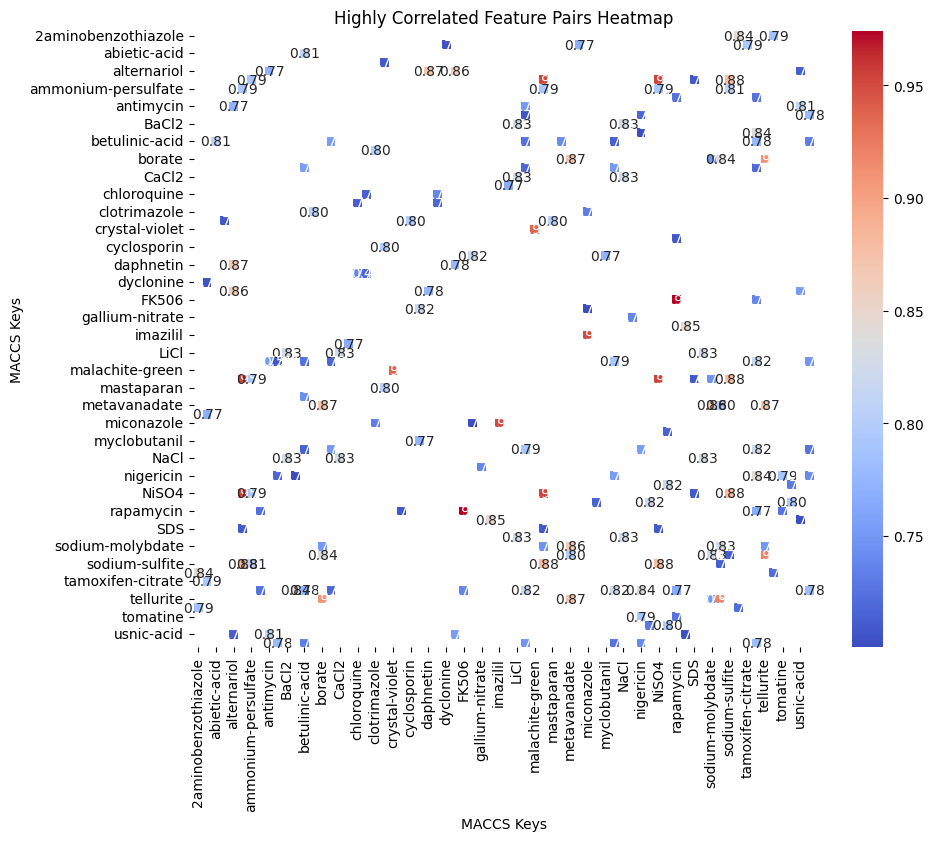

In [191]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming highly_correlated_pairs is your DataFrame containing the highly correlated feature pairs
highly_correlated_pairs = highly_correlated_pairs.dropna(axis=0, how='all').dropna(axis=1, how='all')

plt.figure(figsize=(10, 8))
sns.heatmap(highly_correlated_pairs, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Highly Correlated Feature Pairs Heatmap')
plt.xlabel('MACCS Keys')
plt.ylabel('MACCS Keys')
plt.show()


First, create a graph using NetworkX. This graph will represent the relationships between highly correlated features.

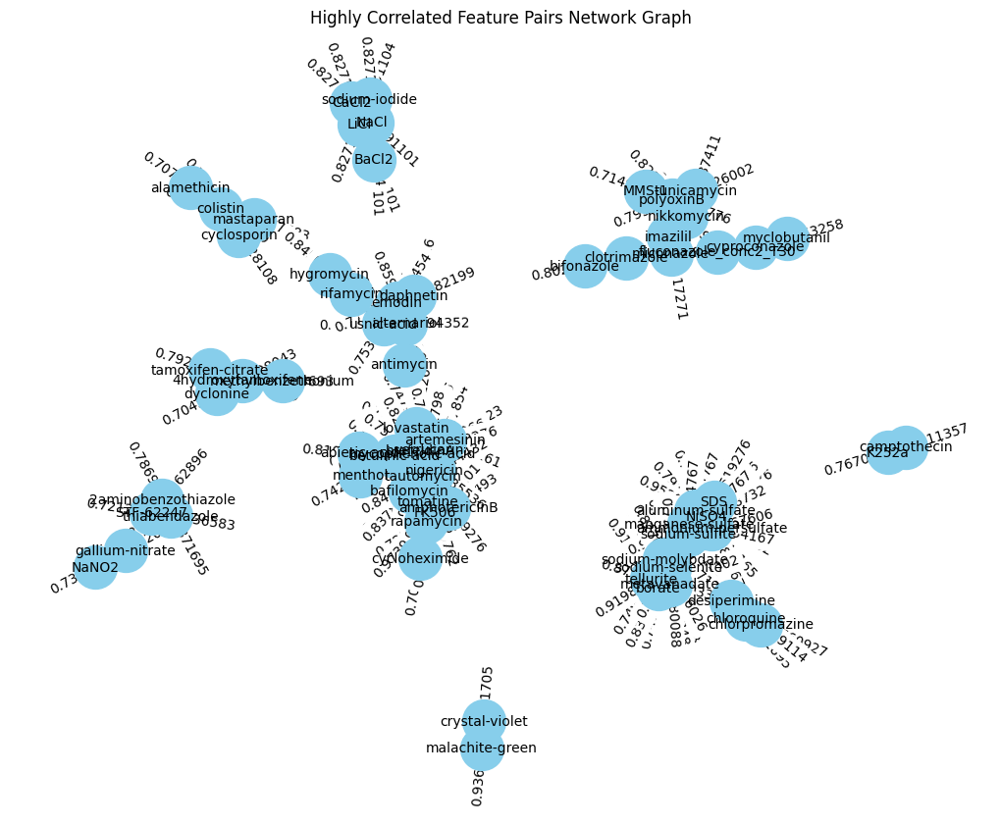

In [192]:
import networkx as nx
import matplotlib.pyplot as plt

# Create a graph
G = nx.Graph()

# Add nodes (MACCS keys)
G.add_nodes_from(highly_correlated_pairs.index)

# Add edges (highly correlated pairs)
for i in highly_correlated_pairs.index:
    for j in highly_correlated_pairs.columns:
        value = highly_correlated_pairs.loc[i, j]
        if not pd.isna(value) and i != j:  # Exclude self-correlation
            G.add_edge(i, j, weight=value)

# Draw the graph
plt.figure(figsize=(10, 8))
pos = nx.spring_layout(G, seed=42)  # Layout the nodes using spring layout algorithm
nx.draw(G, pos, with_labels=True, node_size=1000, font_size=10, node_color='skyblue', edge_color='green')
labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Highly Correlated Feature Pairs Network Graph')
plt.show()



In [193]:
highly_correlated_pairs.head()

Drug_name,2aminobenzothiazole,4hydroxytamoxifene,abietic-acid,alamethicin,alternariol,aluminum-sulfate,ammonium-persulfate,amphotericinB,antimycin,artemesinin,...,sodium-sulfite,STF-62247,tamoxifen-citrate,tautomycin,tellurite,thiabendazole,tomatine,tunicamycin,usnic-acid,verrucarin
Drug_name,,,,,,,,,,,,,,,,,,,,,
2aminobenzothiazole,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.843236,NaN,NaN,NaN,0.786912,NaN,NaN,NaN,NaN
4hydroxytamoxifene,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,0.792439,NaN,NaN,NaN,NaN,NaN,NaN,NaN
abietic-acid,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
alamethicin,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
alternariol,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.771991,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.712194,NaN


We use the Girvan-Newman algorithm for community detection available in NetworkX.
Each node is assigned to a cluster based on the detected communities.
We visualize the network graph with node colors representing different clusters.
We print the nodes and their corresponding clusters.

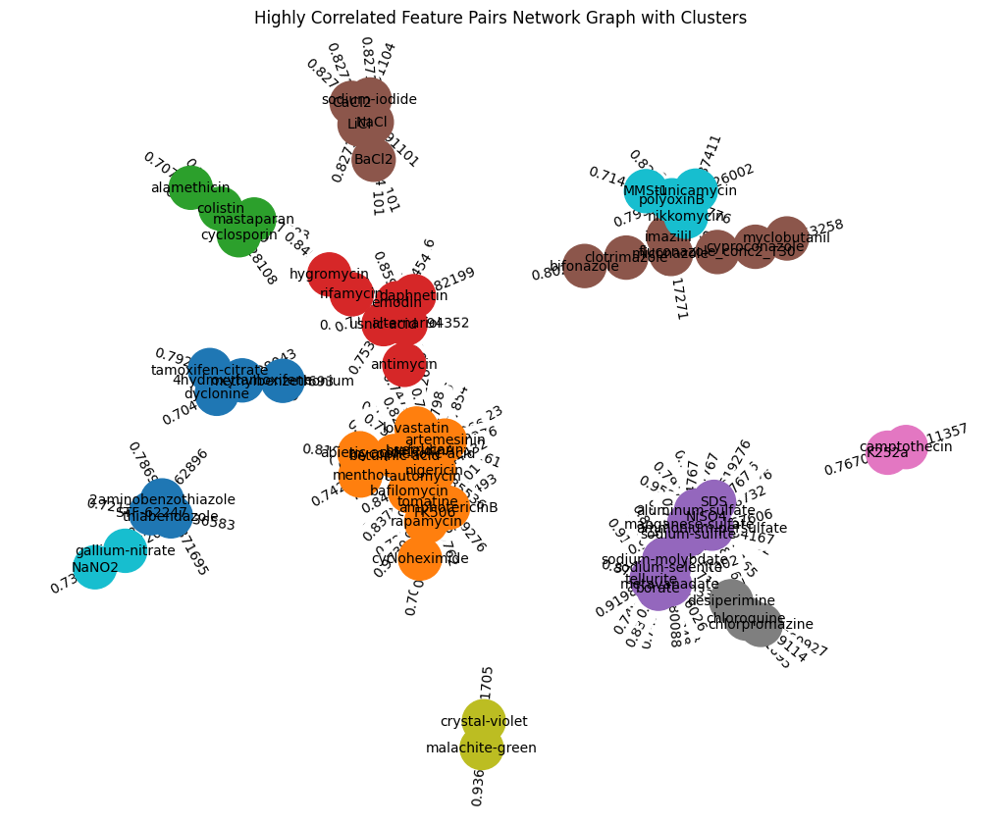

Node	Cluster
thiabendazole	0
STF-62247	0
2aminobenzothiazole	0
methylbenzethonium	1
4hydroxytamoxifene	1
tamoxifen-citrate	1
dyclonine	1
bafilomycin	2
menthol	2
mycophenolic-acid	2
tautomycin	2
artemesinin	2
verrucarin	2
betulinic-acid	2
rapamycin	2
tomatine	2
abietic-acid	2
amphotericinB	2
cycloheximide	2
nigericin	2
brefeldinA	2
lovastatin	2
FK506	2
cyclosporin	3
colistin	3
mastaparan	3
alamethicin	3
hygromycin	4
emodin	4
alternariol	4
daphnetin	4
antimycin	4
rifamycin	4
usnic-acid	4
sodium-sulfite	5
metavanadate	5
sodium-molybdate	5
SDS	5
ammonium-persulfate	5
aluminum-sulfate	5
NiSO4	5
borate	5
sodium-selenite	5
manganese-sulfate	5
tellurite	5
CaCl2	6
sodium-iodide	6
NaCl	6
BaCl2	6
LiCl	6
cyproconazole	7
imazilil	7
myclobutanil	7
bifonazole	7
clotrimazole	7
fluconazole_conc2_T30	7
miconazole	7
camptothecin	8
K252a	8
desiperimine	9
chloroquine	9
chlorpromazine	9
crystal-violet	10
malachite-green	10
gallium-nitrate	11
NaNO2	11
MMS-1	12
polyoxinB	12
tunicamycin	12
nikkomycin	12


In [197]:
import networkx as nx
import matplotlib.pyplot as plt

# Create a graph
G = nx.Graph()

# Add nodes (MACCS keys)
G.add_nodes_from(highly_correlated_pairs.index)

# Add edges (highly correlated pairs)
for i in highly_correlated_pairs.index:
    for j in highly_correlated_pairs.columns:
        value = highly_correlated_pairs.loc[i, j]
        if not pd.isna(value) and i != j:  # Exclude self-correlation
            G.add_edge(i, j, weight=value)

# Use the Girvan-Newman algorithm for community detection
communities = nx.algorithms.community.girvan_newman(G)

# Get the top-level community (clusters)
top_level_communities = next(communities)

# Assign each node to a cluster
node_cluster = {}
for i, community in enumerate(top_level_communities):
    for node in community:
        node_cluster[node] = i

# Draw the graph with node colors representing clusters
plt.figure(figsize=(10, 8))
pos = nx.spring_layout(G, seed=42)  # Layout the nodes using spring layout algorithm
node_colors = [node_cluster[node] for node in G.nodes]
nx.draw(G, pos, with_labels=True, node_size=1000, font_size=10, node_color=node_colors, cmap=plt.cm.tab10, edge_color='gray')
labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)
plt.title('Highly Correlated Feature Pairs Network Graph with Clusters')
plt.show()

# Print the nodes and their corresponding clusters
print("Node\tCluster")
for node, cluster_id in node_cluster.items():
    print(f"{node}\t{cluster_id}")



distribution of the presence/absence of each substructure (MACCS key) using histograms or bar plots, showing the frequency of occurrence of each substructure across the dataset

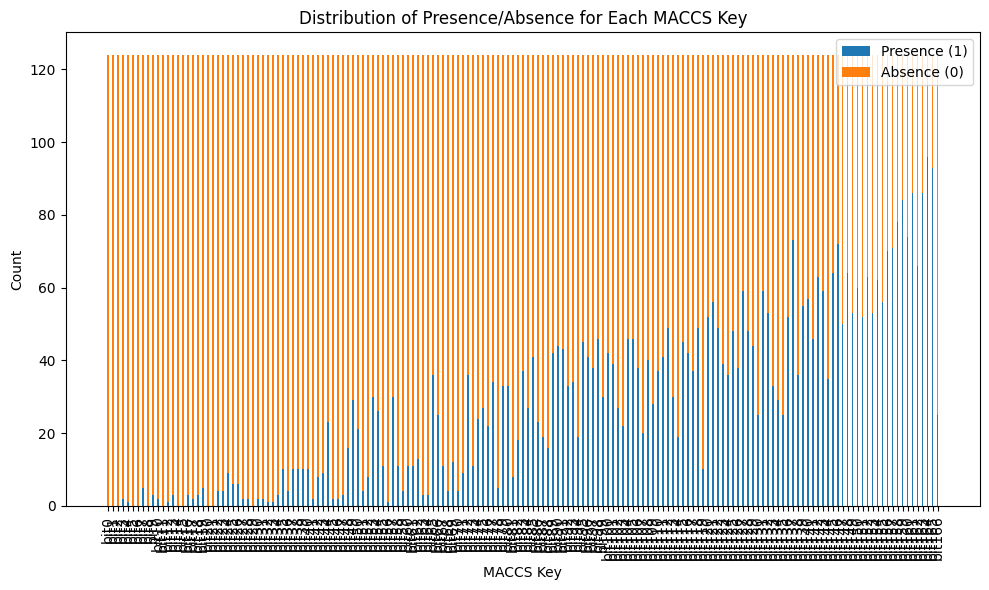

In [202]:
import matplotlib.pyplot as plt

# Calculate the presence (1) count for each MACCS key
presence_counts = dfl.sum()

# Calculate the absence (0) count for each MACCS key
absence_counts = len(dfl) - presence_counts

# Plot the distribution of presence and absence for each MACCS key
plt.figure(figsize=(10, 6))
bar_width = 0.35
index = range(len(presence_counts))

plt.bar(index, presence_counts, bar_width, label='Presence (1)')
plt.bar(index, absence_counts, bar_width, label='Absence (0)', bottom=presence_counts)

plt.xlabel('MACCS Key')
plt.ylabel('Count')
plt.title('Distribution of Presence/Absence for Each MACCS Key')
plt.xticks(index, presence_counts.index, rotation=90)
plt.legend()
plt.tight_layout()
plt.show()


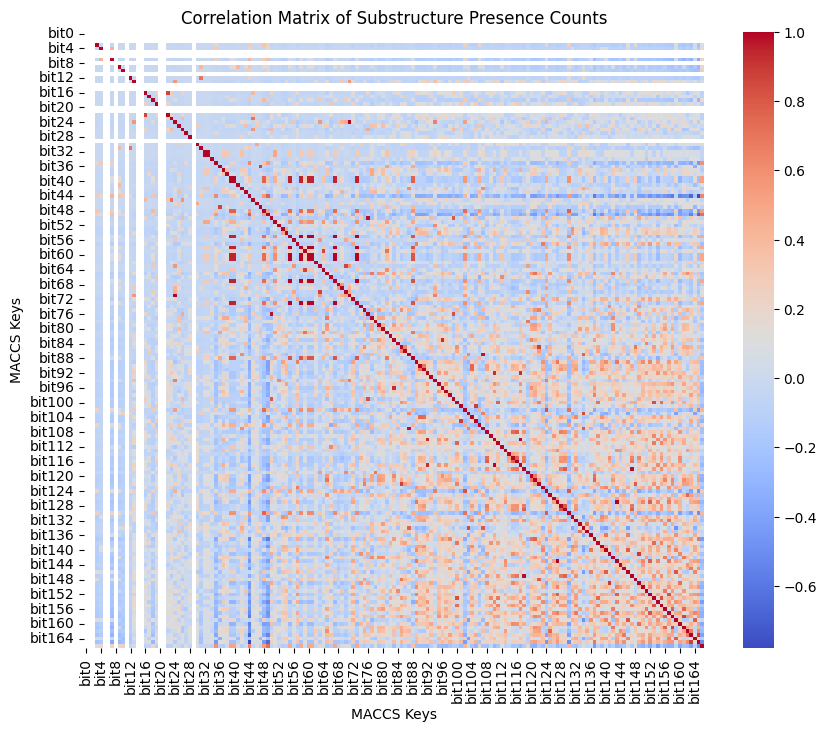

In [205]:


# Calculate the correlation matrix between presence counts of substructures
correlation_matrix = dfl.corr()

# Visualize the correlation matrix as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=False, fmt=".2f", annot_kws={"size":8})
plt.title('Correlation Matrix of Substructure Presence Counts')
plt.xlabel('MACCS Keys')
plt.ylabel('MACCS Keys')
plt.show()


In [ ]:
import numpy as np

# Define a threshold for high correlation
threshold = 0.7  # Adjust as needed

# Mask the correlation matrix to select highly correlated pairs
highly_correlated_pairs_mask = np.abs(correlation_matrix) > threshold

# Filter out the diagonal elements (self-correlation)
np.fill_diagonal(highly_correlated_pairs_mask.values, False)

# Create a DataFrame containing only highly correlated pairs
highly_correlated_pairs_df = correlation_matrix[highly_correlated_pairs_mask]

# Visualize the correlation matrix of highly correlated pairs as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(highly_correlated_pairs_df, cmap='coolwarm', annot=True, fmt=".2f", annot_kws={"size": 8})
plt.title('Correlation Matrix of Highly Correlated Substructure Presence Counts')
plt.xlabel('MACCS Keys')
plt.ylabel('MACCS Keys')
plt.show()


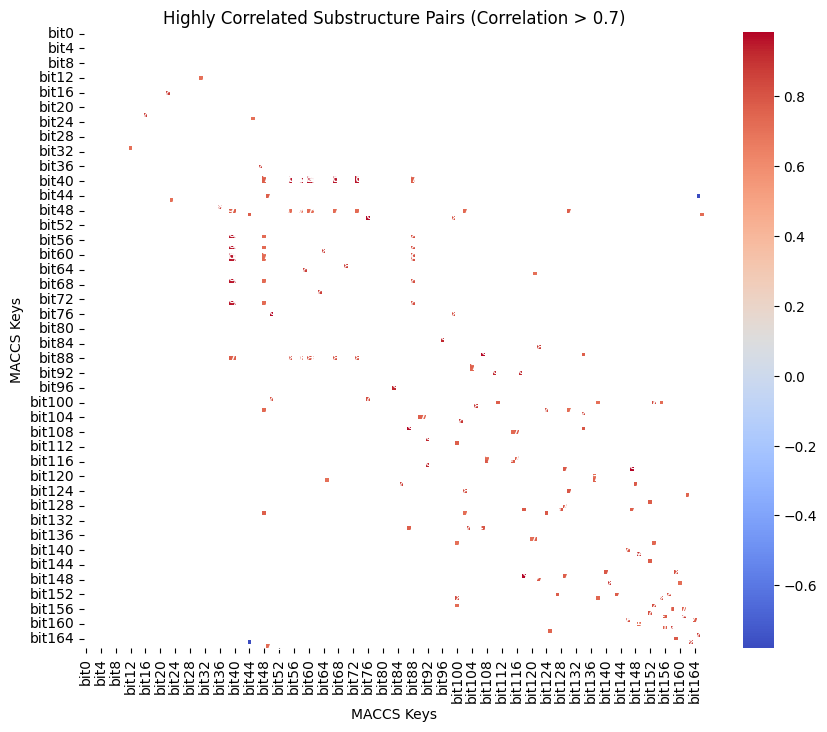

In [211]:
import seaborn as sns

# Calculate the correlation matrix between presence counts of substructures in dfl
correlation_matrix = dfl.corr()

# Set a threshold for high correlation
threshold = 0.7  # Adjust as needed

# Filter the correlation matrix to include only highly correlated pairs
highly_correlated_pair = correlation_matrix[(correlation_matrix.abs() > threshold) & (correlation_matrix < 1)]

# Visualize highly correlated pairs as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(highly_correlated_pair, cmap='coolwarm', annot=True, fmt=".2f")
plt.title('Highly Correlated Substructure Pairs (Correlation > 0.7)')
plt.xlabel('MACCS Keys')
plt.ylabel('MACCS Keys')
plt.show()




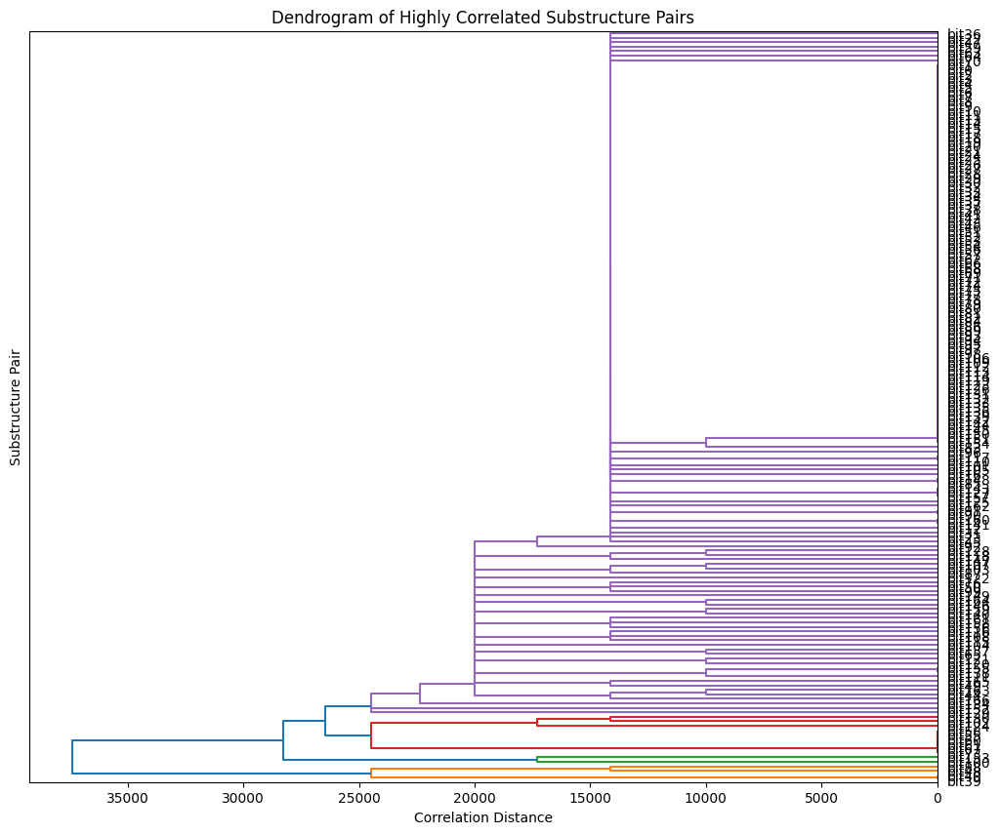

In [214]:
import scipy.cluster.hierarchy as sch

# Replace any non-finite values with a large number (e.g., 9999)
distance_matrix = highly_correlated_pairs.fillna(9999)

# Perform hierarchical clustering
linkage_matrix = sch.linkage(distance_matrix, method='complete')

# Plot the dendrogram
plt.figure(figsize=(12, 10))
dendrogram = sch.dendrogram(linkage_matrix, labels=highly_correlated_pairs.index, orientation='left', leaf_font_size=10)
plt.title('Dendrogram of Highly Correlated Substructure Pairs')
plt.xlabel('Correlation Distance')
plt.ylabel('Substructure Pair')
plt.show()



Clustering Analysis: clustering analysis (e.g., K-means clustering) identifys natural groupings or clusters of samples based on their substructure profiles. This can help uncover underlying patterns in the data and identify subgroups with similar characteristics.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

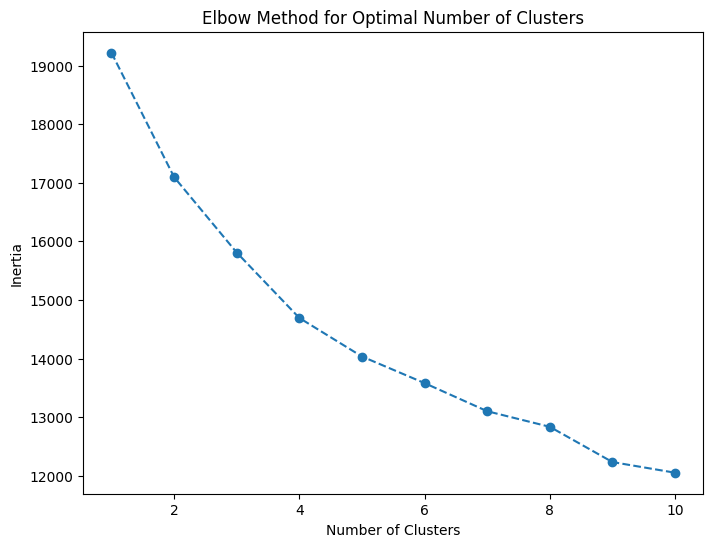

Number of samples in each cluster:
Cluster
1    52
0    43
2    29
Name: count, dtype: int64


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [215]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(dfl)

# Determine the optimal number of clusters using the elbow method
inertia = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(data_scaled)
    inertia.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(8, 6))
plt.plot(range(1, 11), inertia, marker='o', linestyle='--')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.show()

# Based on the elbow curve, choose the optimal number of clusters and perform K-means clustering
n_clusters = 3  # Adjust as needed
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(data_scaled)

# Add cluster labels to the original dataframe
dfl_clustered = dfl.copy()
dfl_clustered['Cluster'] = cluster_labels

# Display the number of samples in each cluster
print("Number of samples in each cluster:")
print(dfl_clustered['Cluster'].value_counts())

# You can further analyze the characteristics of each cluster and interpret the results


In [218]:
dfl_clustered

,bit0,bit1,bit2,bit3,bit4,bit5,bit6,bit7,bit8,bit9,...,bit158,bit159,bit160,bit161,bit162,bit163,bit164,bit165,bit166,Cluster
Drug_name,,,,,,,,,,,,,,,,,,,,,
2aminobenzothiazole,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,1,1,0,1,0,0
2hydroxyethylhydrazine,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,1,0,0,2
3aminotriazole,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,1,0,0,1,0,0
4hydroxytamoxifene,0,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,0,1
A23187,0,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
tunicamycin,0,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,0,1
usnic-acid,0,0,0,0,0,0,0,0,0,0,...,0,1,1,0,1,1,1,1,0,1
valinomycin,0,0,0,0,0,0,0,0,0,0,...,1,1,1,1,0,0,1,1,0,1


In [220]:
# Group samples by cluster label and display sample names in each cluster
for cluster_label, group in dfl_clustered.groupby('Cluster'):
    print(f"Cluster {cluster_label} - Number of samples: {len(group)}")
    print(group.index.tolist())  # Accessing the index values to get sample names
    print()


Cluster 0 - Number of samples: 43
['2aminobenzothiazole', '3aminotriazole', 'acifluorofen-methyl', 'agelasine', 'alexidine', 'allantoin', 'amantadine', 'amiodarone', 'BCS', 'bifonazole', 'caffeine', 'calcofluor-white', 'chloroquine', 'chlorpromazine', 'climbazole', 'clotrimazole', 'crystal-violet', 'cyproconazole', 'desiperimine', 'dyclonine', 'erlotinib', 'fenpropimorph', 'fluconazole_conc2_T30', '5-fluorocytosine', 'fluspirilene', 'haloperidol', 'imazilil', 'itraconazole', 'malachite-green', 'methotrexate', 'methylbenzethonium', 'miconazole', 'myclobutanil', 'nicotinamide', 'phenanthroline', 'selumenitib', 'sertraline', 'sorafenib', 'STF-62247', 'terbinafine', 'thiabendazole', 'thozonium-bromide', 'trimethoprim']

Cluster 1 - Number of samples: 52
['4hydroxytamoxifene', 'A23187', 'abietic-acid', 'aconitine', 'alamethicin', 'alternariol', 'amphotericinB', 'antimycin', 'apicidin', 'artemesinin', 'bafilomycin', 'betulinic-acid', 'brefeldinA', 'camptothecin', 'castanospermine', 'ceruleni

Feature Analysis - Average Presence/Absence of MACCS Keys within Each Cluster:We calculate the average presence/absence of each MACCS key within each cluster by grouping the dataframe dfl_clustered by the 'Cluster' column and computing the mean.

In [221]:
# Calculate the average presence of each MACCS key within each cluster
cluster_avg_presence = dfl_clustered.groupby('Cluster').mean()

# Display the average presence of MACCS keys within each cluster
print("Average presence of MACCS keys within each cluster:")
print(cluster_avg_presence)


Average presence of MACCS keys within each cluster:
         bit0  bit1  bit2      bit3      bit4  bit5  bit6      bit7  bit8  \
Cluster                                                                     
0         0.0   0.0   0.0  0.000000  0.000000   0.0   0.0  0.000000   0.0   
1         0.0   0.0   0.0  0.000000  0.000000   0.0   0.0  0.000000   0.0   
2         0.0   0.0   0.0  0.068966  0.034483   0.0   0.0  0.172414   0.0   

             bit9  ...    bit157    bit158    bit159    bit160    bit161  \
Cluster            ...                                                     
0        0.000000  ...  0.465116  0.953488  0.372093  0.627907  1.000000   
1        0.000000  ...  0.923077  0.634615  0.961538  0.884615  0.634615   
2        0.103448  ...  0.103448  0.137931  0.620690  0.034483  0.344828   

           bit162    bit163    bit164    bit165    bit166  
Cluster                                                    
0        0.930233  0.930233  0.581395  0.976744  0.069767  
1

Visualization - Distribution of MACCS Keys within Each Cluster:We visualize the distribution of MACCS keys within each cluster using histograms, where each histogram represents the distribution of a MACCS key within a cluster.

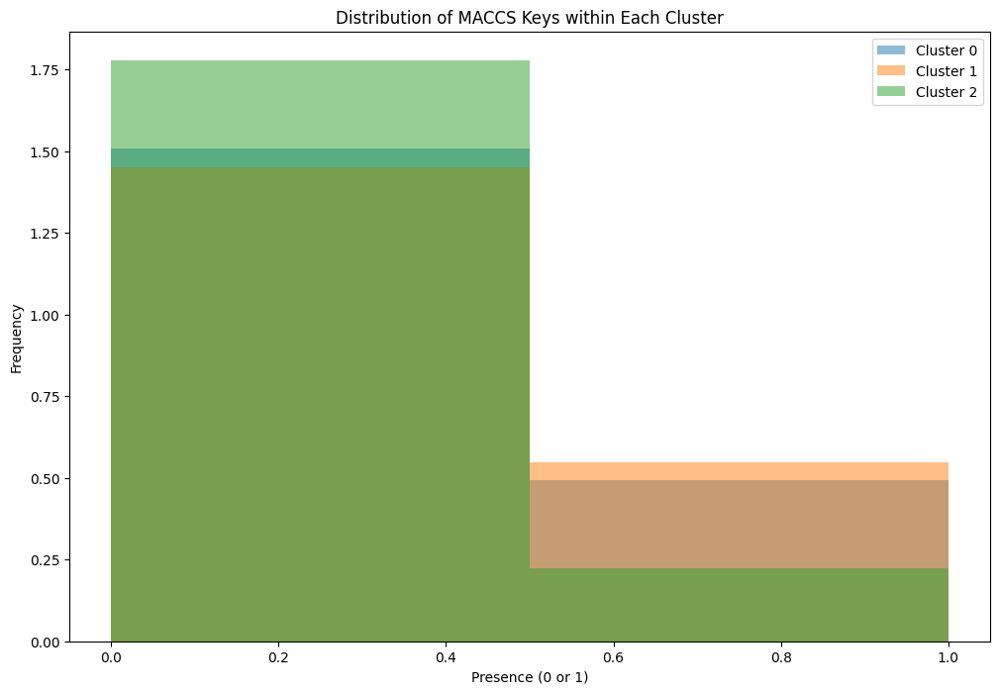

In [222]:
# Visualize the distribution of MACCS keys within each cluster using histograms
plt.figure(figsize=(12, 8))
for cluster_label, group in dfl_clustered.groupby('Cluster'):
    plt.hist(group.drop(columns='Cluster').values.flatten(), bins=2, alpha=0.5, label=f'Cluster {cluster_label}', density=True)
plt.title('Distribution of MACCS Keys within Each Cluster')
plt.xlabel('Presence (0 or 1)')
plt.ylabel('Frequency')
plt.legend()
plt.show()


Statistical Testing - Differences in Presence/Absence of MACCS Keys between Clusters:We perform t-tests for each MACCS key between clusters to determine if there are significant differences in the presence/absence of specific substructures between clusters. We then filter and display significant p-values (e.g., p < 0.05) indicating differences between clusters.

In [223]:
from scipy.stats import ttest_ind

# Perform t-tests for each MACCS key between clusters
p_values = {}
for column in dfl.columns:
    p_values[column] = ttest_ind(dfl_clustered[dfl_clustered['Cluster'] == 0][column],
                                  dfl_clustered[dfl_clustered['Cluster'] == 1][column]).pvalue

# Filter significant p-values (e.g., p < 0.05)
significant_p_values = {key: value for key, value in p_values.items() if value < 0.05}

# Display significant p-values
print("Significant p-values (p < 0.05) for differences in presence/absence of MACCS keys between clusters:")
print(significant_p_values)


Significant p-values (p < 0.05) for differences in presence/absence of MACCS keys between clusters:
{'bit25': 0.005035146664724859, 'bit26': 0.021249887112847993, 'bit36': 0.024588327486545193, 'bit38': 0.0004032399596983652, 'bit42': 0.0009590805864318697, 'bit49': 0.005035146664724859, 'bit50': 0.0010309210150234486, 'bit52': 0.011199598326244547, 'bit53': 0.009974887777949278, 'bit54': 1.2758215672333058e-05, 'bit57': 7.918855012038372e-07, 'bit65': 1.8716523229564542e-06, 'bit72': 1.2677262583457362e-05, 'bit75': 0.00791024203654185, 'bit76': 0.0005316542425570295, 'bit77': 5.0317689100023304e-11, 'bit78': 0.024588327486545193, 'bit79': 0.015903824575860488, 'bit80': 0.0008622912304717296, 'bit85': 0.02345654194030681, 'bit86': 0.0012962495858912266, 'bit87': 7.873397692300952e-09, 'bit89': 2.1436140489425982e-08, 'bit90': 1.654134397022879e-05, 'bit91': 3.44093144264257e-08, 'bit92': 0.002385305973426814, 'bit99': 0.0006219172963199915, 'bit103': 3.431762514710156e-07, 'bit104': 2

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


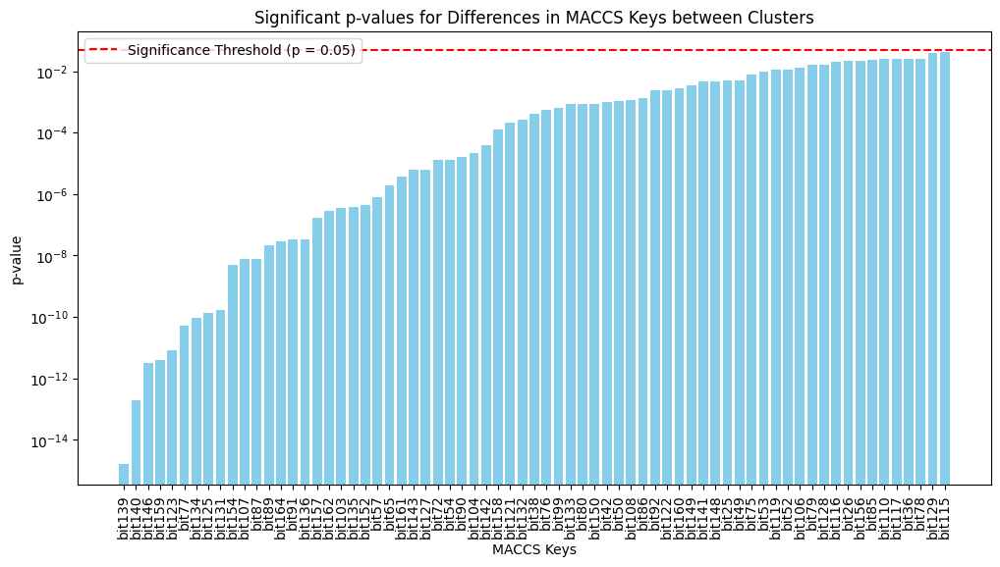

In [224]:
import matplotlib.pyplot as plt

# Convert the significant p-values dictionary to a DataFrame for easier plotting
significant_p_values_df = pd.DataFrame.from_dict(significant_p_values, orient='index', columns=['p-value'])

# Sort the DataFrame by p-values for better visualization
significant_p_values_df = significant_p_values_df.sort_values(by='p-value', ascending=True)

# Plot the significant p-values
plt.figure(figsize=(12, 6))
plt.bar(significant_p_values_df.index, significant_p_values_df['p-value'], color='skyblue')
plt.title('Significant p-values for Differences in MACCS Keys between Clusters')
plt.xlabel('MACCS Keys')
plt.ylabel('p-value')
plt.xticks(rotation=90)
plt.yscale('log')  # Use logarithmic scale for better visualization
plt.axhline(y=0.05, color='red', linestyle='--', label='Significance Threshold (p = 0.05)')
plt.legend()
plt.show()


# mission impossible, lets go

In [226]:
!pip install torch-geometric

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 5.7 MB/s eta 0:00:00
